<a href="https://colab.research.google.com/github/alecchoi/AI-Object-Detection/blob/main/TensorFlow_Hub_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt # to visualize the images
import numpy as np #math library
from PIL import Image #Python imaging library
import tensorflow as tf
import tensorflow_hub as hub
print('TensorFlow version: ' + tf.__version__)
print('TensorFlow Hub version: '+  hub.__version__)

TensorFlow version: 2.18.0
TensorFlow Hub version: 0.16.1


##Tensorflow Hub Setting

In [ ]:
# Models: https://tfhub.dev/tensorflow/collections/object_detection/1
model_paths = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4298, done.
remote: Counting objects: 100% (4298/4298), done.
remote: Compressing objects: 100% (3280/3280), done.
remote: Total 4298 (delta 1208), reused 2183 (delta 946), pack-reused 0 (from 0)
Receiving objects: 100% (4298/4298), 52.93 MiB | 20.90 MiB/s, done.
Resolving deltas: 100% (1208/1208), done.


In [ ]:
%%bash
#linux compiler: # https://linuxcommandlibrary.com/man/protoc
#this will help compile the files inside the git
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=. #generate the python files
cp object_detection/packages/tf2/setup.py .
python -m pip install .

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils
from object_detection.utils import ops

In [ ]:
path_to_labels = '/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
classes_indicies = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name = True)


In [ ]:
classes_indicies

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [ ]:
model_name = 'CenterNet HourGlass104 Keypoints 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']

In [ ]:
model_path = model_paths[model_name]

In [ ]:
print('Model name: ' + model_name)
print('Model path: ' + model_path)

Model name: CenterNet HourGlass104 Keypoints 512x512
Model path: https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1


In [ ]:
model = hub.load(model_path)

##Loading the Image

In [ ]:
image = Image.open('/content/japan_image.jpg')

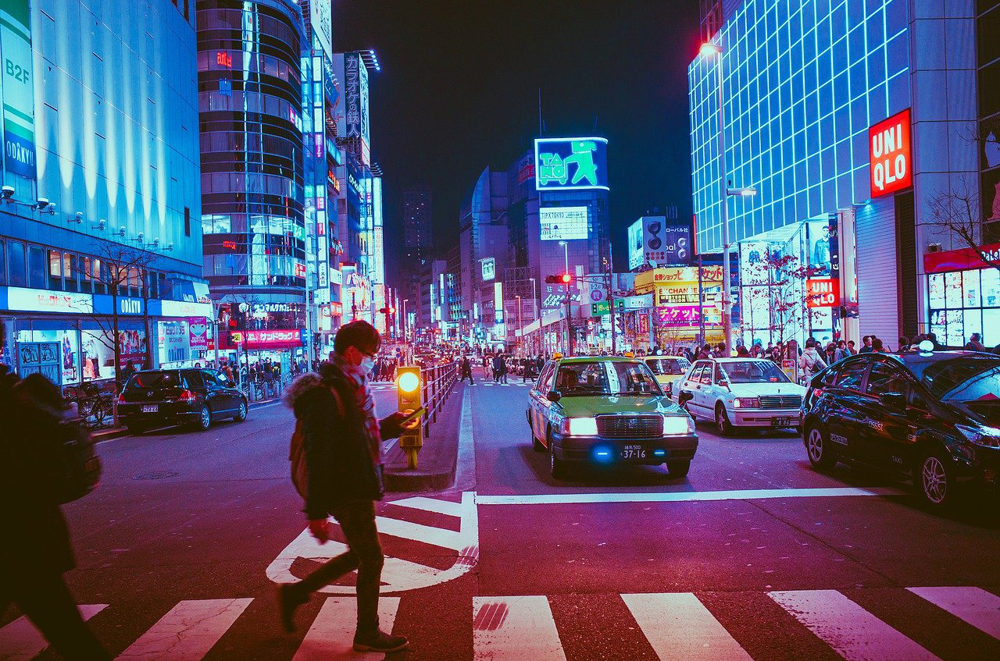

In [ ]:
image

In [ ]:
image.size

(1280, 847)

In [ ]:
type(image) # its in pil form

PIL.PngImagePlugin.PngImageFile

In [ ]:
(width, height)=image.size
print(width, height)

1280 847


In [ ]:
image = np.array(image.getdata()).reshape((1, height, width, 3)).astype(np.uint8)
image.shape

(1, 847, 1280, 3)

In [ ]:
type(image) # now its numpy form

numpy.ndarray

In [ ]:
image

array([[[[  8, 109, 105],
         [  5, 106, 100],
         [  5, 106,  98],
         ...,
         [ 38,  27,   5],
         [ 37,  31,   0],
         [ 37,  32,   0]],

        [[  6, 109, 105],
         [  3, 108, 101],
         [  3, 109,  99],
         ...,
         [ 36,  25,   7],
         [ 31,  23,   0],
         [ 34,  27,   0]],

        [[  0, 109, 104],
         [  0, 108, 102],
         [  0, 109, 100],
         ...,
         [ 47,  35,  23],
         [ 46,  36,  27],
         [ 31,  20,  14]],

        ...,

        [[ 74,  39,  20],
         [ 65,  30,  10],
         [ 63,  28,   8],
         ...,
         [ 40,  26,   0],
         [ 39,  25,   0],
         [ 38,  24,   0]],

        [[ 67,  30,  11],
         [ 62,  27,   7],
         [ 65,  30,  10],
         ...,
         [ 40,  26,   0],
         [ 39,  25,   0],
         [ 39,  25,   0]],

        [[ 57,  20,   1],
         [ 53,  18,   0],
         [ 60,  25,   5],
         ...,
         [ 41,  27,   1],
        

<function matplotlib.pyplot.show(close=None, block=None)>

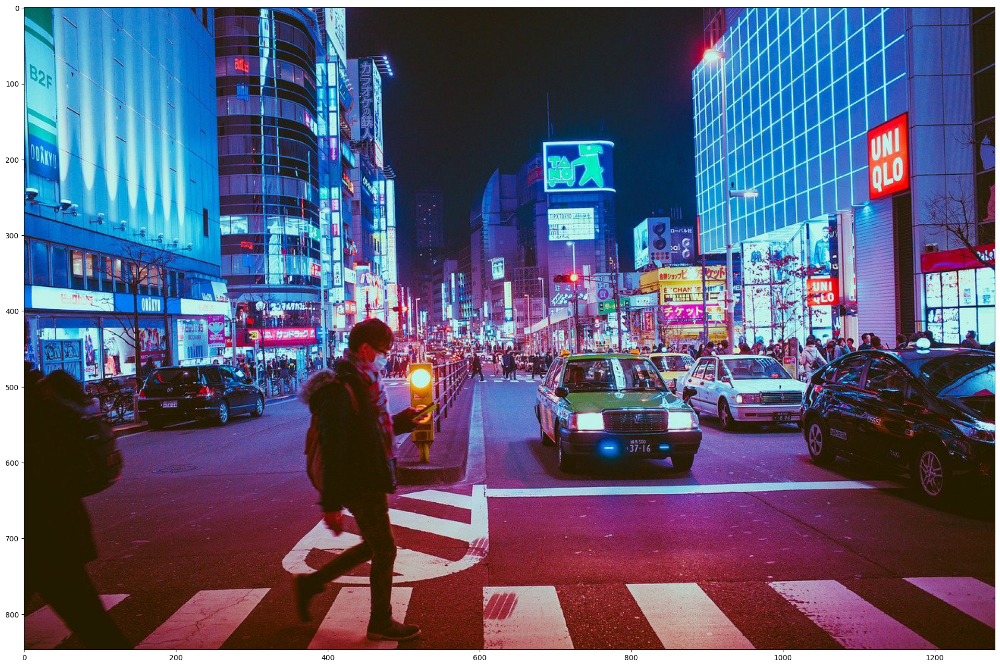

In [ ]:
%matplotlib inline
plt.figure(figsize = (24,32))
plt.imshow(image[0])
plt.show
#visualize the same image in a different format

##Object Detection

In [ ]:
results = model(image)

In [ ]:
results # first two numbesr in deteciton boxes is x and y coordinates while the last two are how big the object is

{'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>,
 'detection_keypoints': <tf.Tensor: shape=(1, 100, 17, 2), dtype=float32, numpy=
 array([[[[0.        , 0.        ],
          [0.        , 0.        ],
          [0.        , 0.        ],
          ...,
          [0.        , 0.        ],
          [0.        , 0.        ],
          [0.        , 0.        ]],
 
         [[0.        , 0.        ],
          [0.        , 0.        ],
          [0.        , 0.        ],
          ...,
          [0.        , 0.        ],
          [0.        , 0.        ],
          [0.        , 0.        ]],
 
         [[0.54784685, 0.36724946],
          [0.5405089 , 0.36745498],
          [0.5390339 , 0.3662508 ],
          ...,
          [0.84286875, 0.37283337],
          [0.9489829 , 0.3688426 ],
          [0.956639  , 0.36791676]],
 
         ...,
 
         [[0.52849865, 0.6920227 ],
          [0.5259575 , 0.69234073],
          [0.5235828 , 0.6966712 ]

In [ ]:
classes_indicies[41]

{'id': 41, 'name': 'skateboard'}

In [ ]:
result = {key: value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['num_detections', 'detection_keypoints', 'detection_boxes', 'detection_classes', 'detection_scores', 'detection_keypoint_scores'])


<function matplotlib.pyplot.show(close=None, block=None)>

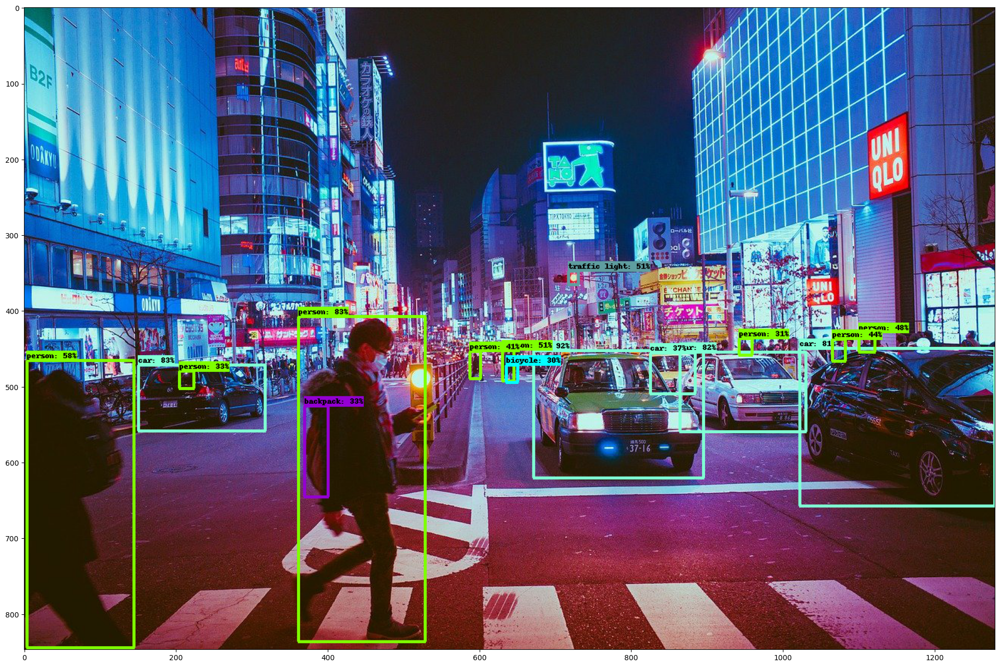

In [ ]:
image_detection = image.copy()
visualization_utils.visualize_boxes_and_labels_on_image_array(
    image_detection[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0]).astype(int),
    result['detection_scores'][0],
    classes_indicies,
    max_boxes_to_draw = 200,
    use_normalized_coordinates = True,
    min_score_thresh = .30
)

plt.figure(figsize = (24,32))
plt.imshow(image_detection[0])
plt.show